<a href="https://colab.research.google.com/github/brayla-oya/DDDS-My-Projects/blob/main/Project_4_Spotify_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project 4: Music Popularity Prediction

## Problem Definition


This project will take data features collected for songs that have been on the Top 200 Weekly (Global) charts of Spotify in 2020 & 2021. The popularity of the song will be predicted using a tree-based regression model trained on these features.

The goals for the project are:

- Minimize the cross-validated ***root mean squared error ( RMSE )*** when predicting the popularity of a new song.

- Determine the importance of the features in driving the regression result.
The project will be done using tree-based regression techniques as covered in class. The hyperparameters of the trees should be carefully selected to avoid over-fitting.

There are three main challenges for this project:

1. Determining the outcome ( i.e. target ).  There is a "popularity" column.  But other columns may or may not be more appropriate indicators of popularity.

1. Choosing appropriate predictors ( i.e. features ). When building a machine learning model, we want to make sure that we consider how the model will be ultimately used. For this project, we are predicting the popularity of a new song. Therefore, we should only include the predictors we would have for a new song. It might help to imagine that the song will not be released for several weeks.

1. Data cleaning and feature engineering. Some creative cleaning and/or feature engineering may be needed to extract useful information for prediction.



Once again, be sure to go through the whole data science process and document as such in your Jupyter notebook.

The data is available AWS at https://ddc-datascience.s3.amazonaws.com/Projects/Project.4-Spotify/Data/Spotify.csv .

## Data Collection/Sources


- This is a supervised regression problem. The target as of now is popularity because it is numerical & continuous.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn import datasets, metrics, model_selection
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
import pickle

In [ ]:
url = "https://ddc-datascience.s3.amazonaws.com/Projects/Project.4-Spotify/Data/Spotify.csv"
!curl -s -I {url}

HTTP/1.1 200 OK
x-amz-id-2: VSCDclz0K97fs9c61obp37ZbK8riHV8R30Ib90rQu5J/3mBHak/8wsGHkARXYt/boLwRiiUBd4k=
x-amz-request-id: E4ARQ9MZK4NXWCQ0
Date: Wed, 09 Jul 2025 21:42:20 GMT
Last-Modified: Wed, 04 Oct 2023 17:23:56 GMT
ETag: "65b9875b11e0d7ea03ee2af024f45e99"
x-amz-server-side-encryption: AES256
Accept-Ranges: bytes
Content-Type: text/csv
Content-Length: 738124
Server: AmazonS3



In [ ]:
!curl -s -O {url}

In [ ]:
ls -la

total 740
drwxr-xr-x 1 root root   4096 Jul  9 20:01 ./
drwxr-xr-x 1 root root   4096 Jul  9 20:01 ../
drwxr-xr-x 4 root root   4096 Jul  7 19:54 .config/
drwxr-xr-x 1 root root   4096 Jul  7 19:55 sample_data/
-rw-r--r-- 1 root root 738124 Jul  9 21:42 Spotify.csv


In [ ]:
!head -1 Spotify.csv | tr , '\n' | cat -n

     1	Index
     2	Highest Charting Position
     3	Number of Times Charted
     4	Week of Highest Charting
     5	Song Name
     6	Streams
     7	Artist
     8	Artist Followers
     9	Song ID
    10	Genre
    11	Release Date
    12	Weeks Charted
    13	Popularity
    14	Danceability
    15	Energy
    16	Loudness
    17	Speechiness
    18	Acousticness
    19	Liveness
    20	Tempo
    21	Duration (ms)
    22	Valence
    23	Chord


## Data Cleaning


In [ ]:
# Load data
url = "https://ddc-datascience.s3.amazonaws.com/Projects/Project.4-Spotify/Data/Spotify.csv"
spotify_data = pd.read_csv( url , index_col = 0 )
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
spotify_data

,Highest Charting Position,Number of Times Charted,Week of Highest Charting,Song Name,Streams,Artist,Artist Followers,Song ID,Genre,Release Date,Weeks Charted,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence,Chord
Index,,,,,,,,,,,,,,,,,,,,,,
1,1,8,2021-07-23--2021-07-30,Beggin',"48,633,449",Måneskin,3377762,3Wrjm47oTz2sjIgck11l5e,"['indie rock italiano', 'italian pop']",2017-12-08,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,100,0.714,0.8,-4.808,0.0504,0.127,0.359,134.002,211560,0.589,B
2,2,3,2021-07-23--2021-07-30,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022,5HCyWlXZPP0y6Gqq8TgA20,['australian hip hop'],2021-07-09,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,99,0.591,0.764,-5.484,0.0483,0.0383,0.103,169.928,141806,0.478,C#/Db
3,1,11,2021-06-25--2021-07-02,good 4 u,"40,162,559",Olivia Rodrigo,6266514,4ZtFanR9U6ndgddUvNcjcG,['pop'],2021-05-21,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,99,0.563,0.664,-5.044,0.154,0.335,0.0849,166.928,178147,0.688,A
4,3,5,2021-07-02--2021-07-09,Bad Habits,"37,799,456",Ed Sheeran,83293380,6PQ88X9TkUIAUIZJHW2upE,"['pop', 'uk pop']",2021-06-25,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,98,0.808,0.897,-3.712,0.0348,0.0469,0.364,126.026,231041,0.591,B
5,5,1,2021-07-23--2021-07-30,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565,27NovPIUIRrOZoCHxABJwK,"['lgbtq+ hip hop', 'pop rap']",2021-07-23,2021-07-23--2021-07-30,96,0.736,0.704,-7.409,0.0615,0.0203,0.0501,149.995,212000,0.894,D#/Eb
6,1,18,2021-05-07--2021-05-14,MONTERO (Call Me By Your Name),"30,071,134",Lil Nas X,5473565,67BtfxlNbhBmCDR2L2l8qd,"['lgbtq+ hip hop', 'pop rap']",2021-03-31,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,97,0.61,0.508,-6.682,0.152,0.297,0.384,178.818,137876,0.758,G#/Ab
7,3,16,2021-05-14--2021-05-21,Kiss Me More (feat. SZA),"29,356,736",Doja Cat,8640063,748mdHapucXQri7IAO8yFK,"['dance pop', 'pop']",2021-04-09,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,94,0.762,0.701,-3.541,0.0286,0.235,0.123,110.968,208867,0.742,G#/Ab
8,2,10,2021-06-18--2021-06-25,Todo De Ti,"26,951,613",Rauw Alejandro,6080597,4fSIb4hdOQ151TILNsSEaF,"['puerto rican pop', 'trap latino']",2021-05-20,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,95,0.78,0.718,-3.605,0.0506,0.31,0.0932,127.949,199604,0.342,D#/Eb
9,3,8,2021-06-18--2021-06-25,Yonaguni,"25,030,128",Bad Bunny,36142273,2JPLbjOn0wPCngEot2STUS,"['latin', 'reggaeton', 'trap latino']",2021-06-04,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,96,0.644,0.648,-4.601,0.118,0.276,0.135,179.951,206710,0.44,C#/Db


In [ ]:
spotify_data.shape

(1556, 22)

In [ ]:
pd.set_option('display.max_columns', None)
spotify_data.head()

,Highest Charting Position,Number of Times Charted,Week of Highest Charting,Song Name,Streams,Artist,Artist Followers,Song ID,Genre,Release Date,Weeks Charted,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence,Chord
Index,,,,,,,,,,,,,,,,,,,,,,
1,1,8,2021-07-23--2021-07-30,Beggin',"48,633,449",Måneskin,3377762,3Wrjm47oTz2sjIgck11l5e,"['indie rock italiano', 'italian pop']",2017-12-08,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,100,0.714,0.8,-4.808,0.0504,0.127,0.359,134.002,211560,0.589,B
2,2,3,2021-07-23--2021-07-30,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022,5HCyWlXZPP0y6Gqq8TgA20,['australian hip hop'],2021-07-09,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,99,0.591,0.764,-5.484,0.0483,0.0383,0.103,169.928,141806,0.478,C#/Db
3,1,11,2021-06-25--2021-07-02,good 4 u,"40,162,559",Olivia Rodrigo,6266514,4ZtFanR9U6ndgddUvNcjcG,['pop'],2021-05-21,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,99,0.563,0.664,-5.044,0.154,0.335,0.0849,166.928,178147,0.688,A
4,3,5,2021-07-02--2021-07-09,Bad Habits,"37,799,456",Ed Sheeran,83293380,6PQ88X9TkUIAUIZJHW2upE,"['pop', 'uk pop']",2021-06-25,2021-07-23--2021-07-30\n2021-07-16--2021-07-23...,98,0.808,0.897,-3.712,0.0348,0.0469,0.364,126.026,231041,0.591,B
5,5,1,2021-07-23--2021-07-30,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565,27NovPIUIRrOZoCHxABJwK,"['lgbtq+ hip hop', 'pop rap']",2021-07-23,2021-07-23--2021-07-30,96,0.736,0.704,-7.409,0.0615,0.0203,0.0501,149.995,212000,0.894,D#/Eb


In [ ]:
spotify_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1556 entries, 1 to 1556
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Highest Charting Position  1556 non-null   int64 
 1   Number of Times Charted    1556 non-null   int64 
 2   Week of Highest Charting   1556 non-null   object
 3   Song Name                  1556 non-null   object
 4   Streams                    1556 non-null   object
 5   Artist                     1556 non-null   object
 6   Artist Followers           1556 non-null   object
 7   Song ID                    1556 non-null   object
 8   Genre                      1556 non-null   object
 9   Release Date               1556 non-null   object
 10  Weeks Charted              1556 non-null   object
 11  Popularity                 1556 non-null   object
 12  Danceability               1556 non-null   object
 13  Energy                     1556 non-null   object
 14  Loudness     

In [ ]:
spotify_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Highest Charting Position,1556.0,87.744216,58.147225,1.0,37.0,80.0,137.0,200.0
Number of Times Charted,1556.0,10.668380,16.360546,1.0,1.0,4.0,12.0,142.0


In [ ]:
# Convert necessary columns to numeric
spotify_data['Popularity'] = pd.to_numeric(spotify_data['Popularity'], errors='coerce')
spotify_data['Danceability'] = pd.to_numeric(spotify_data['Danceability'], errors='coerce')
spotify_data['Energy'] = pd.to_numeric(spotify_data['Energy'], errors='coerce')
spotify_data['Loudness'] = pd.to_numeric(spotify_data['Loudness'], errors='coerce')
spotify_data['Speechiness'] = pd.to_numeric(spotify_data['Speechiness'], errors='coerce')
spotify_data['Acousticness'] = pd.to_numeric(spotify_data['Acousticness'], errors='coerce')
spotify_data['Liveness'] = pd.to_numeric(spotify_data['Liveness'], errors='coerce')
spotify_data['Tempo'] = pd.to_numeric(spotify_data['Tempo'], errors='coerce')
spotify_data['Duration (ms)'] = pd.to_numeric(spotify_data['Duration (ms)'], errors='coerce')
spotify_data['Valence'] = pd.to_numeric(spotify_data['Valence'], errors='coerce')
spotify_data['Artist Followers'] = pd.to_numeric(spotify_data['Artist Followers'], errors='coerce')

In [ ]:
# Check for nulls
spotify_data.isnull().sum()

,0
Highest Charting Position,0
Number of Times Charted,0
Week of Highest Charting,0
Song Name,0
Streams,0
Artist,0
Artist Followers,11
Song ID,0
Genre,0
Release Date,0


In [ ]:
spotify_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Highest Charting Position,1556.0,8.774422e+01,5.814723e+01,1.000000,3.700000e+01,8.000000e+01,1.370000e+02,2.000000e+02
Number of Times Charted,1556.0,1.066838e+01,1.636055e+01,1.000000,1.000000e+00,4.000000e+00,1.200000e+01,1.420000e+02
Artist Followers,1545.0,1.471690e+07,1.667579e+07,4883.000000,2.123734e+06,6.852509e+06,2.269875e+07,8.333778e+07
Popularity,1545.0,7.008932e+01,1.582403e+01,0.000000,6.500000e+01,7.300000e+01,8.000000e+01,1.000000e+02
Danceability,1545.0,6.899968e-01,1.424440e-01,0.150000,5.990000e-01,7.070000e-01,7.960000e-01,9.800000e-01
Energy,1545.0,6.334951e-01,1.615770e-01,0.054000,5.320000e-01,6.420000e-01,7.520000e-01,9.700000e-01
Loudness,1545.0,-6.348474e+00,2.509281e+00,-25.166000,-7.491000e+00,-5.990000e+00,-4.711000e+00,1.509000e+00
Speechiness,1545.0,1.236557e-01,1.103827e-01,0.023200,4.560000e-02,7.650000e-02,1.650000e-01,8.840000e-01
Acousticness,1545.0,2.486945e-01,2.503259e-01,0.000025,4.850000e-02,1.610000e-01,3.880000e-01,9.940000e-01
Liveness,1545.0,1.812024e-01,1.440710e-01,0.019700,9.660000e-02,1.240000e-01,2.170000e-01,9.620000e-01


11 Nulls in multiple columns. I will fill the nulls with the median of each column, since some of my graphs have outliers.
Tempo will be imputed with mean since it is fairly symmetrical. I know I could have dropped them.

In [ ]:
# Fill NaN values with median/mean
spotify_data['Popularity'] = spotify_data['Popularity'].fillna(spotify_data['Popularity'].median())
spotify_data['Danceability'] = spotify_data['Danceability'].fillna(spotify_data['Danceability'].median())
spotify_data['Energy'] = spotify_data['Energy'].fillna(spotify_data['Energy'].median())
spotify_data['Loudness'] = spotify_data['Loudness'].fillna(spotify_data['Loudness'].median())
spotify_data['Speechiness'] = spotify_data['Speechiness'].fillna(spotify_data['Speechiness'].median())
spotify_data['Acousticness'] = spotify_data['Acousticness'].fillna(spotify_data['Acousticness'].median())
spotify_data['Liveness'] = spotify_data['Liveness'].fillna(spotify_data['Liveness'].median())
spotify_data['Tempo'] = spotify_data['Tempo'].fillna(spotify_data['Tempo'].mean())
spotify_data['Duration (ms)'] = spotify_data['Duration (ms)'].fillna(spotify_data['Duration (ms)'].median())
spotify_data['Valence'] = spotify_data['Valence'].fillna(spotify_data['Valence'].median())
spotify_data['Artist Followers'] = spotify_data['Artist Followers'].fillna(spotify_data['Artist Followers'].median())


In [ ]:
spotify_data.isnull().sum()

,0
Highest Charting Position,0
Number of Times Charted,0
Week of Highest Charting,0
Song Name,0
Streams,0
Artist,0
Artist Followers,0
Song ID,0
Genre,0
Release Date,0


In [ ]:
spotify_data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Highest Charting Position,1556.0,8.774422e+01,5.814723e+01,1.000000,3.700000e+01,8.000000e+01,1.370000e+02,2.000000e+02
Number of Times Charted,1556.0,1.066838e+01,1.636055e+01,1.000000,1.000000e+00,4.000000e+00,1.200000e+01,1.420000e+02
Artist Followers,1556.0,1.466131e+07,1.662977e+07,4883.000000,2.142789e+06,6.852509e+06,2.253630e+07,8.333778e+07
Popularity,1556.0,7.010990e+01,1.576985e+01,0.000000,6.500000e+01,7.300000e+01,8.000000e+01,1.000000e+02
Danceability,1556.0,6.901170e-01,1.419465e-01,0.150000,5.997500e-01,7.070000e-01,7.950000e-01,9.800000e-01
Energy,1556.0,6.335553e-01,1.610061e-01,0.054000,5.337500e-01,6.420000e-01,7.500000e-01,9.700000e-01
Loudness,1556.0,-6.345940e+00,2.500570e+00,-25.166000,-7.481500e+00,-5.990000e+00,-4.718500e+00,1.509000e+00
Speechiness,1556.0,1.233224e-01,1.100626e-01,0.023200,4.570000e-02,7.650000e-02,1.640000e-01,8.840000e-01
Acousticness,1556.0,2.480746e-01,2.495472e-01,0.000025,4.912500e-02,1.610000e-01,3.860000e-01,9.940000e-01
Liveness,1556.0,1.807980e-01,1.436405e-01,0.019700,9.705000e-02,1.240000e-01,2.152500e-01,9.620000e-01


Nulls gone!! Now I'm going to convert the Release Date to date format & split the month and year into their own columns.

In [ ]:
# change Release date to date format
spotify_data['Release Date'] = pd.to_datetime(spotify_data['Release Date'], errors='coerce')

In [ ]:
spotify_data['Release Year'] = spotify_data['Release Date'].dt.year
spotify_data['Release Month'] = spotify_data['Release Date'].dt.month

In [ ]:
# Change the release month and year into date format
spotify_data['Release Month'] = pd.to_datetime(spotify_data['Release Month'], errors='coerce')
spotify_data['Release Year'] = pd.to_datetime(spotify_data['Release Year'], errors='coerce')

In [ ]:
spotify_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1556 entries, 1 to 1556
Data columns (total 24 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Highest Charting Position  1556 non-null   int64         
 1   Number of Times Charted    1556 non-null   int64         
 2   Week of Highest Charting   1556 non-null   object        
 3   Song Name                  1556 non-null   object        
 4   Streams                    1556 non-null   object        
 5   Artist                     1556 non-null   object        
 6   Artist Followers           1556 non-null   float64       
 7   Song ID                    1556 non-null   object        
 8   Genre                      1556 non-null   object        
 9   Release Date               1528 non-null   datetime64[ns]
 10  Weeks Charted              1556 non-null   object        
 11  Popularity                 1556 non-null   float64       
 12  Danceabilit

Drop unnecesary columns

In [ ]:
# Columns to drop
spotify_data2 = spotify_data.drop(['Highest Charting Position', 'Number of Times Charted', 'Week of Highest Charting', 'Song ID', 'Release Date', 'Weeks Charted', 'Chord', 'Genre'], axis=1)
spotify_data2

,Song Name,Streams,Artist,Artist Followers,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence,Release Year,Release Month
Index,,,,,,,,,,,,,,,,
1,Beggin',"48,633,449",Måneskin,3377762.0,100.0,0.714,0.800,-4.808,0.0504,0.127000,0.3590,134.002000,211560.0,0.5890,1970-01-01 00:00:00.000002017,1970-01-01 00:00:00.000000012
2,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022.0,99.0,0.591,0.764,-5.484,0.0483,0.038300,0.1030,169.928000,141806.0,0.4780,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000007
3,good 4 u,"40,162,559",Olivia Rodrigo,6266514.0,99.0,0.563,0.664,-5.044,0.1540,0.335000,0.0849,166.928000,178147.0,0.6880,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000005
4,Bad Habits,"37,799,456",Ed Sheeran,83293380.0,98.0,0.808,0.897,-3.712,0.0348,0.046900,0.3640,126.026000,231041.0,0.5910,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000006
5,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565.0,96.0,0.736,0.704,-7.409,0.0615,0.020300,0.0501,149.995000,212000.0,0.8940,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000007
6,MONTERO (Call Me By Your Name),"30,071,134",Lil Nas X,5473565.0,97.0,0.610,0.508,-6.682,0.1520,0.297000,0.3840,178.818000,137876.0,0.7580,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000003
7,Kiss Me More (feat. SZA),"29,356,736",Doja Cat,8640063.0,94.0,0.762,0.701,-3.541,0.0286,0.235000,0.1230,110.968000,208867.0,0.7420,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000004
8,Todo De Ti,"26,951,613",Rauw Alejandro,6080597.0,95.0,0.780,0.718,-3.605,0.0506,0.310000,0.0932,127.949000,199604.0,0.3420,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000005
9,Yonaguni,"25,030,128",Bad Bunny,36142273.0,96.0,0.644,0.648,-4.601,0.1180,0.276000,0.1350,179.951000,206710.0,0.4400,1970-01-01 00:00:00.000002021,1970-01-01 00:00:00.000000006


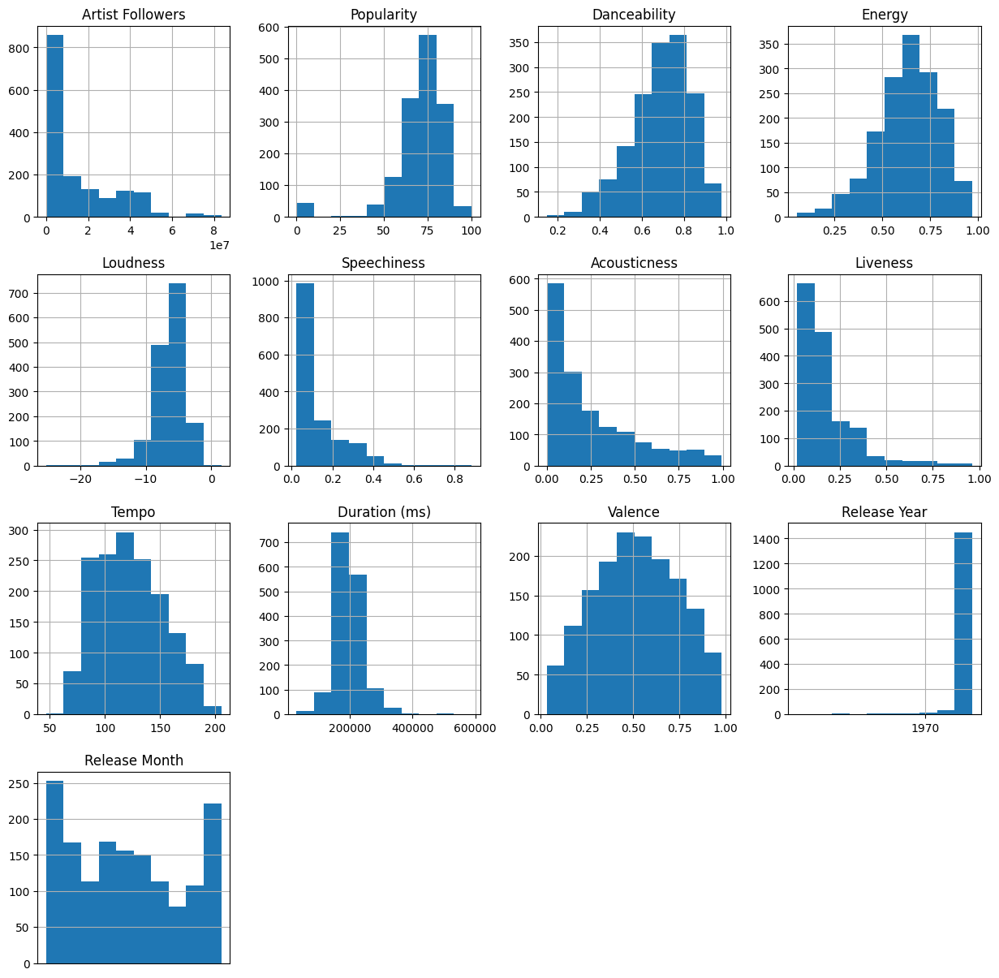

In [ ]:
# histograms
spotify_data2.hist(figsize=(15,15));

In [ ]:
spotify_data2.isnull().sum()

,0
Song Name,0
Streams,0
Artist,0
Artist Followers,0
Popularity,0
Danceability,0
Energy,0
Loudness,0
Speechiness,0
Acousticness,0


In [ ]:
spotify_data2[spotify_data2['Release Year'].isnull()][['Song Name','Artist','Release Year', 'Release Month']]


,Song Name,Artist,Release Year,Release Month
Index,,,,
36,NOT SOBER (feat. Polo G & Stunna Gambino),The Kid LAROI,NaT,NaT
159,Runaway,AURORA,NaT,NaT
164,34+35,Ariana Grande,NaT,NaT
237,Wonderwall - Remastered,Oasis,NaT,NaT
465,Richer (feat. Polo G),Rod Wave,NaT,NaT
515,Star Shopping,Lil Peep,NaT,NaT
531,"34+35 Remix (feat. Doja Cat, Megan Thee Stalli...",Ariana Grande,NaT,NaT
553,Wonderwall,Oasis,NaT,NaT
632,Sleigh Ride,The Ronettes,NaT,NaT


Now that I have which songs have nulls, I want to manually fill them with the correct month and year. I know this is a little extra, but I wanted to see how songs released during certain months did.

In [ ]:
# Manually add release year and month to each song that has null
# spotify_data2.loc[index, ['Release Year', 'Release Month']] = [2020, 6]
spotify_data2.loc[36, ['Release Year', 'Release Month']] = [2021, 7]

Did not finish the release month and year, so we will drop them and hope I can get back to it.

In [ ]:
spotify_data2 = spotify_data2.drop(['Release Year', 'Release Month'], axis=1)
spotify_data2

,Song Name,Streams,Artist,Artist Followers,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence
Index,,,,,,,,,,,,,,
1,Beggin',"48,633,449",Måneskin,3377762.0,100.0,0.714,0.800,-4.808,0.0504,0.127000,0.3590,134.002000,211560.0,0.5890
2,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022.0,99.0,0.591,0.764,-5.484,0.0483,0.038300,0.1030,169.928000,141806.0,0.4780
3,good 4 u,"40,162,559",Olivia Rodrigo,6266514.0,99.0,0.563,0.664,-5.044,0.1540,0.335000,0.0849,166.928000,178147.0,0.6880
4,Bad Habits,"37,799,456",Ed Sheeran,83293380.0,98.0,0.808,0.897,-3.712,0.0348,0.046900,0.3640,126.026000,231041.0,0.5910
5,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565.0,96.0,0.736,0.704,-7.409,0.0615,0.020300,0.0501,149.995000,212000.0,0.8940
6,MONTERO (Call Me By Your Name),"30,071,134",Lil Nas X,5473565.0,97.0,0.610,0.508,-6.682,0.1520,0.297000,0.3840,178.818000,137876.0,0.7580
7,Kiss Me More (feat. SZA),"29,356,736",Doja Cat,8640063.0,94.0,0.762,0.701,-3.541,0.0286,0.235000,0.1230,110.968000,208867.0,0.7420
8,Todo De Ti,"26,951,613",Rauw Alejandro,6080597.0,95.0,0.780,0.718,-3.605,0.0506,0.310000,0.0932,127.949000,199604.0,0.3420
9,Yonaguni,"25,030,128",Bad Bunny,36142273.0,96.0,0.644,0.648,-4.601,0.1180,0.276000,0.1350,179.951000,206710.0,0.4400


In [ ]:
# Make a clean copy
spotify_clean = spotify_data2.copy()
spotify_clean

,Song Name,Streams,Artist,Artist Followers,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence
Index,,,,,,,,,,,,,,
1,Beggin',"48,633,449",Måneskin,3377762.0,100.0,0.714,0.800,-4.808,0.0504,0.127000,0.3590,134.002000,211560.0,0.5890
2,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022.0,99.0,0.591,0.764,-5.484,0.0483,0.038300,0.1030,169.928000,141806.0,0.4780
3,good 4 u,"40,162,559",Olivia Rodrigo,6266514.0,99.0,0.563,0.664,-5.044,0.1540,0.335000,0.0849,166.928000,178147.0,0.6880
4,Bad Habits,"37,799,456",Ed Sheeran,83293380.0,98.0,0.808,0.897,-3.712,0.0348,0.046900,0.3640,126.026000,231041.0,0.5910
5,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565.0,96.0,0.736,0.704,-7.409,0.0615,0.020300,0.0501,149.995000,212000.0,0.8940
6,MONTERO (Call Me By Your Name),"30,071,134",Lil Nas X,5473565.0,97.0,0.610,0.508,-6.682,0.1520,0.297000,0.3840,178.818000,137876.0,0.7580
7,Kiss Me More (feat. SZA),"29,356,736",Doja Cat,8640063.0,94.0,0.762,0.701,-3.541,0.0286,0.235000,0.1230,110.968000,208867.0,0.7420
8,Todo De Ti,"26,951,613",Rauw Alejandro,6080597.0,95.0,0.780,0.718,-3.605,0.0506,0.310000,0.0932,127.949000,199604.0,0.3420
9,Yonaguni,"25,030,128",Bad Bunny,36142273.0,96.0,0.644,0.648,-4.601,0.1180,0.276000,0.1350,179.951000,206710.0,0.4400


In [ ]:
spotify_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1556 entries, 1 to 1556
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Song Name         1556 non-null   object 
 1   Streams           1556 non-null   object 
 2   Artist            1556 non-null   object 
 3   Artist Followers  1556 non-null   float64
 4   Popularity        1556 non-null   float64
 5   Danceability      1556 non-null   float64
 6   Energy            1556 non-null   float64
 7   Loudness          1556 non-null   float64
 8   Speechiness       1556 non-null   float64
 9   Acousticness      1556 non-null   float64
 10  Liveness          1556 non-null   float64
 11  Tempo             1556 non-null   float64
 12  Duration (ms)     1556 non-null   float64
 13  Valence           1556 non-null   float64
dtypes: float64(11), object(3)
memory usage: 214.6+ KB


## Exploratory Data Analysis


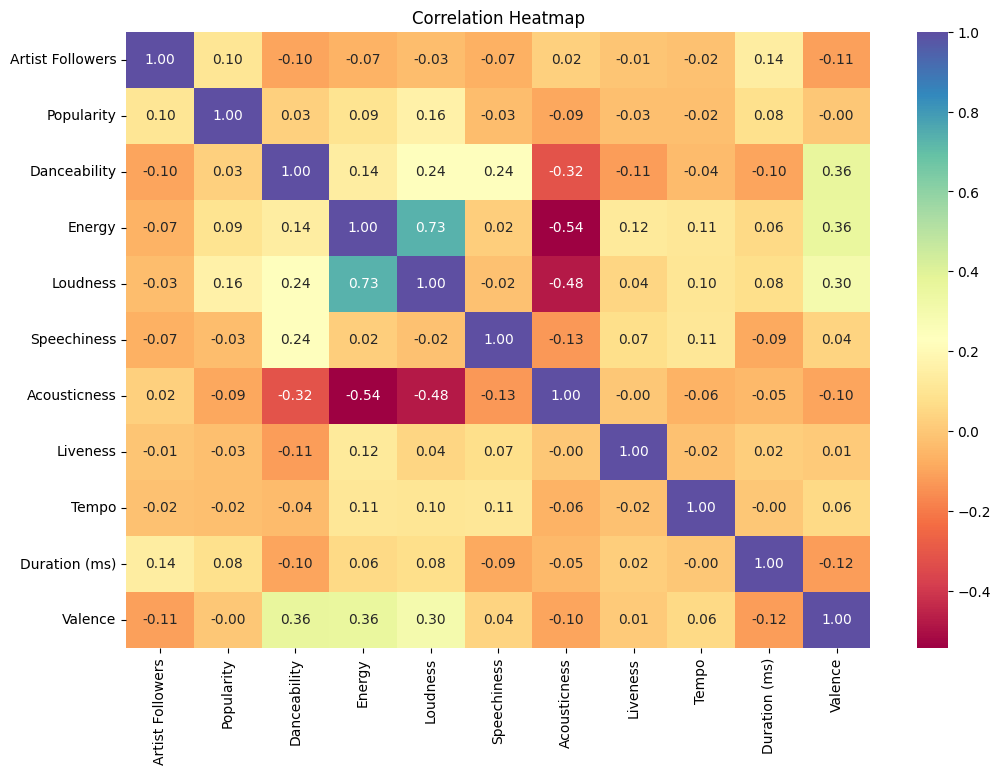

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    spotify_clean.select_dtypes(include=np.number).corr(),
    annot=True,
    fmt=".2f",
    cmap='Spectral',
    )
plt.title('Correlation Heatmap')
plt.show()

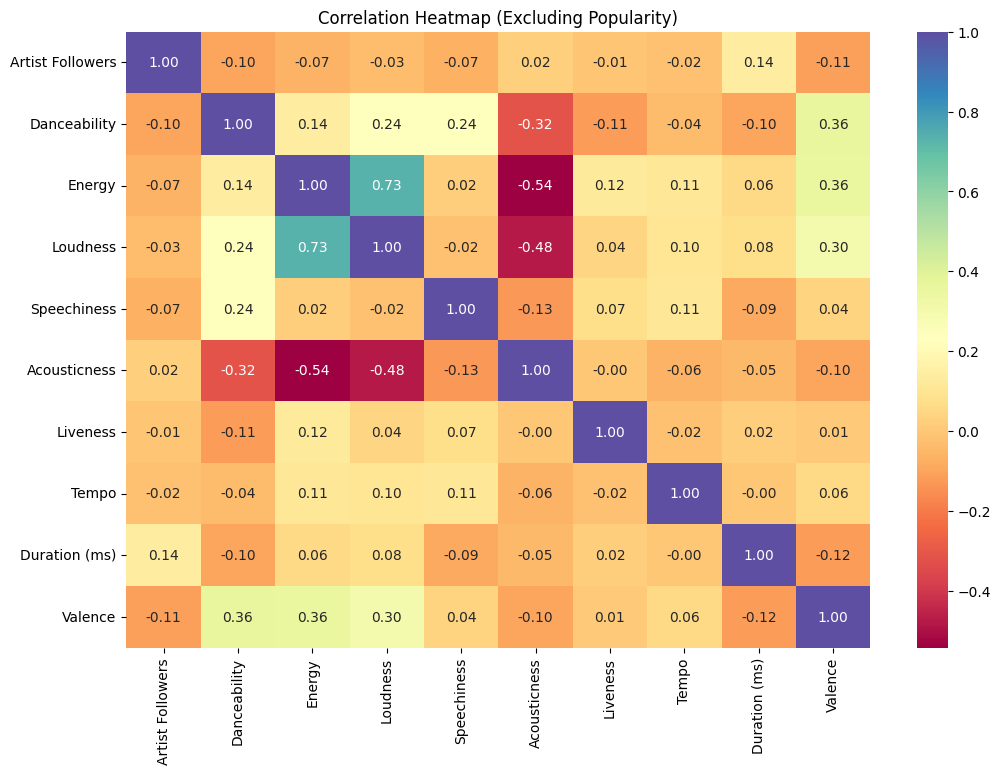

In [ ]:
plt.figure(figsize=(12, 8))

# Create correlation matrix without 'popularity'
corr_matrix = spotify_clean.select_dtypes(include=np.number).corr()
corr_matrix = corr_matrix.drop(index='Popularity', columns='Popularity')

# Plot the heatmap
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='Spectral'
)
plt.title('Correlation Heatmap (Excluding Popularity)')
plt.show()


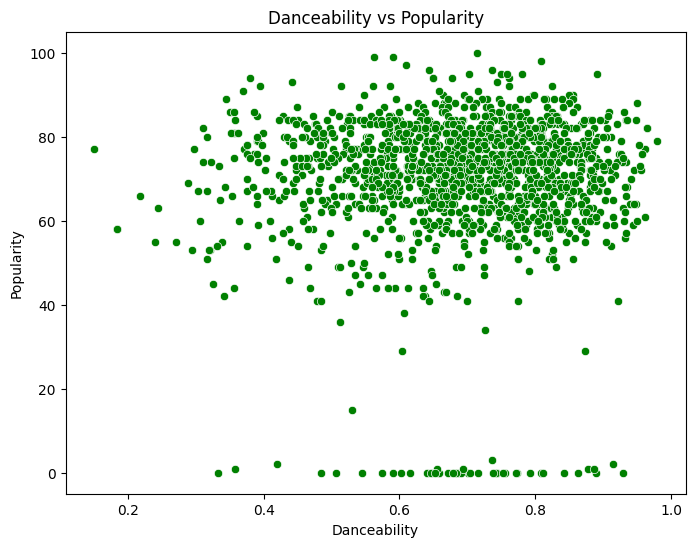

In [ ]:
# Scatter plot of Danceability vs Popularity
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Danceability', y='Popularity', color='green')
plt.title('Danceability vs Popularity')
plt.xlabel('Danceability')
plt.ylabel('Popularity')
plt.show()

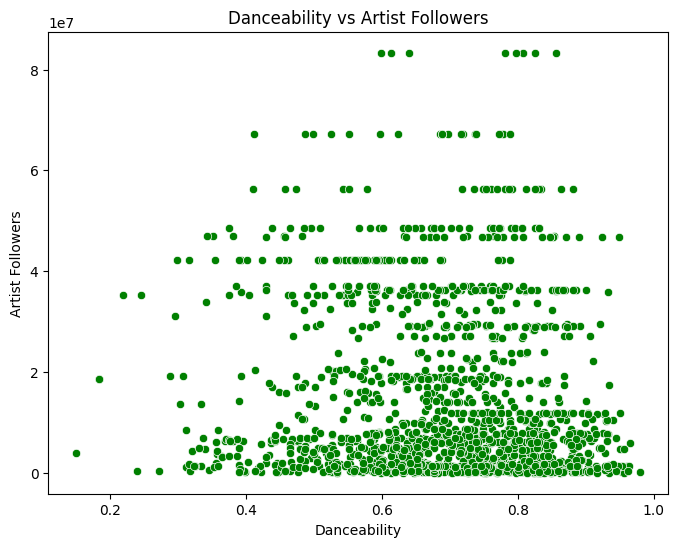

In [ ]:
# Scatter plot of Danceability vs Popularity
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Danceability', y='Artist Followers', color='green')
plt.title('Danceability vs Artist Followers')
plt.xlabel('Danceability')
plt.ylabel('Artist Followers')
plt.show()

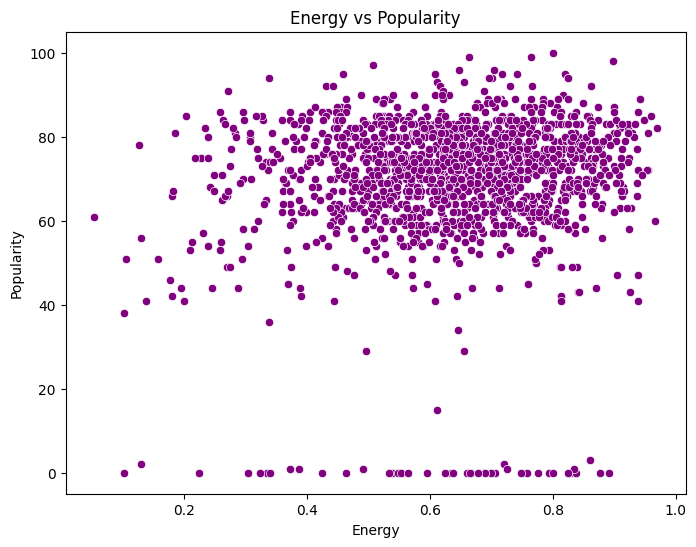

In [ ]:
# Scatter plot of Energy vs Popularity
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Energy', y='Popularity', color='purple')
plt.title('Energy vs Popularity')
plt.xlabel('Energy')
plt.ylabel('Popularity')
plt.show()

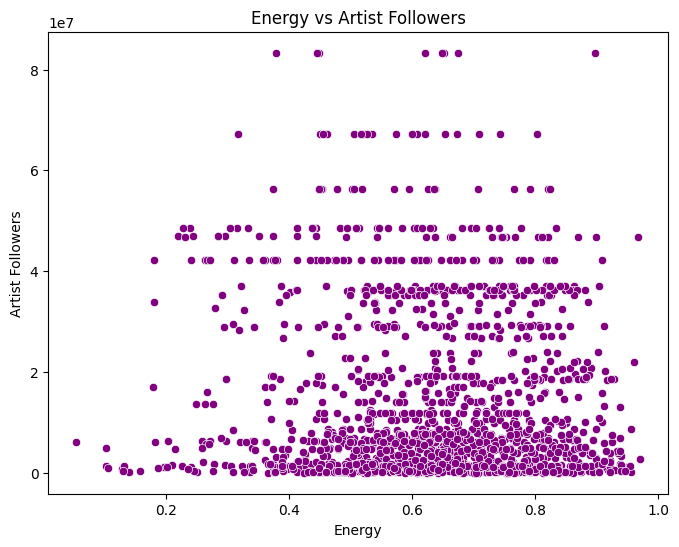

In [ ]:
# Scatter plot of Energy vs Artist Followers
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Energy', y='Artist Followers', color='purple')
plt.title('Energy vs Artist Followers')
plt.xlabel('Energy')
plt.ylabel('Artist Followers')
plt.show()

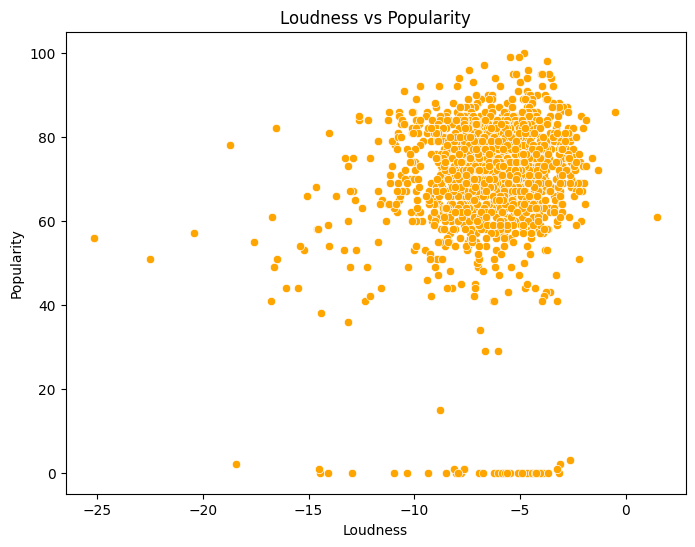

In [ ]:
# Scatter plot of Loudness vs Popularity
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Loudness', y='Popularity', color='orange')
plt.title('Loudness vs Popularity')
plt.xlabel('Loudness')
plt.ylabel('Popularity')
plt.show()

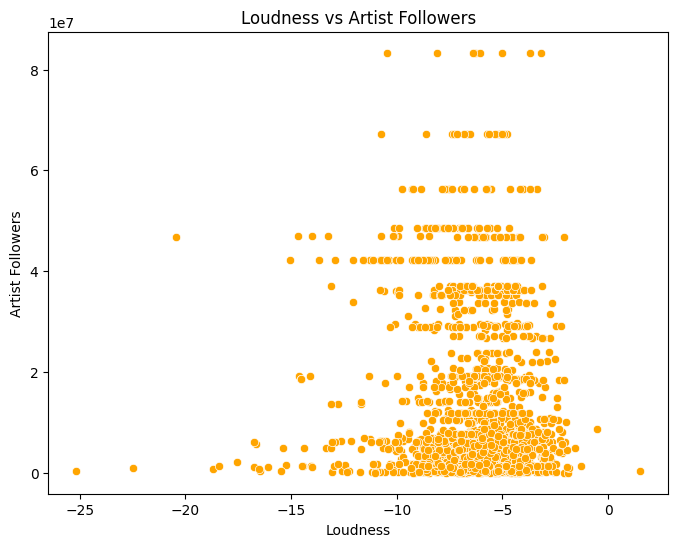

In [ ]:
# Scatter plot of Loudness vs Artist Followers
plt.figure(figsize=(8, 6))
sns.scatterplot(data=spotify_clean, x='Loudness', y='Artist Followers', color='orange')
plt.title('Loudness vs Artist Followers')
plt.xlabel('Loudness')
plt.ylabel('Artist Followers')
plt.show()

### Decision Tree Regression

In [ ]:
# Select features known before release
features = ['Danceability', 'Energy', 'Tempo', 'Valence',
            'Acousticness', 'Speechiness', 'Liveness', 'Duration (ms)', 'Artist Followers']
X = spotify_clean[features]
y = spotify_clean['Popularity']

In [ ]:
numLoops = 500

rms_error = np.zeros(numLoops)

for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
  model = DecisionTreeRegressor(max_depth=3)  # Arbitrarily choosing max_depth of 3
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  rms_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"CV RMSE: {rms_error.mean().round(2)}")


CV RMSE: 10.96


Note: First ran w/o Artist Followers and had RMSE of 16. Added Artist Followers and RMSE of 11.

In [ ]:
max_depths = [1,2,3,4,5,6,7,8,9,10]
rms_depth = np.zeros(len(max_depths))
std_depth = np.zeros(len(max_depths))

numLoops = 500

for n, depth in enumerate(max_depths):
  rms_error = np.zeros(numLoops)

  for idx in range(0,numLoops):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)
    model = DecisionTreeRegressor(max_depth=depth)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    rms_error[idx] = np.sqrt(mean_squared_error(y_test, y_pred))

  rms_depth[n] = rms_error.mean()
  std_depth[n] = rms_error.std( ddof = 1 )

In [ ]:
pd.DataFrame( zip( max_depths, rms_depth, std_depth ) )

,0,1,2
0,1,15.241688,1.061287
1,2,11.051445,1.038548
2,3,11.070451,0.822135
3,4,11.198891,0.814508
4,5,11.403647,0.879909
5,6,11.550856,0.907216
6,7,11.790863,0.918236
7,8,11.979043,0.975057
8,9,12.256087,0.930008
9,10,12.549100,0.906800


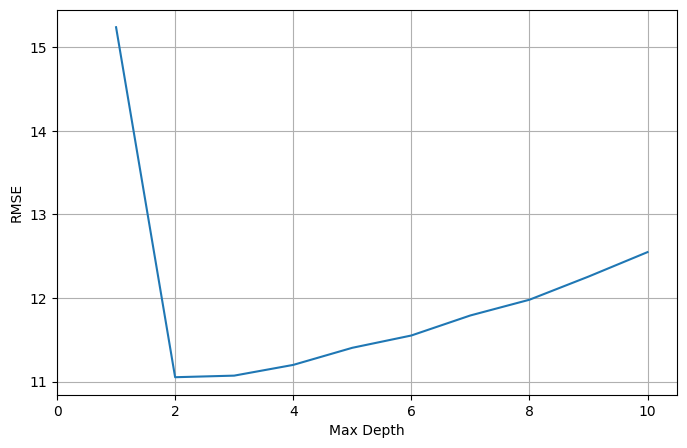

In [ ]:
# Plot result
plt.figure(figsize = (8,5))
plt.plot(max_depths, rms_depth)
plt.xlabel('Max Depth')
plt.ylabel('RMSE')
plt.xlim(0, 10.5)
plt.grid()


In [ ]:
# Re run with max depth = 2
numLoops = 500

rms_error = np.zeros( numLoops )

for idx in range( 0, numLoops ):
  X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.2 )
  model = DecisionTreeRegressor( max_depth=2 )
  model.fit( X_train, y_train )
  y_pred = model.predict( X_test )
  rms_error[idx] = np.sqrt( mean_squared_error( y_test, y_pred ) )

print(f"CV RMSE: {rms_error.mean().round(2)}")


CV RMSE: 10.94


### Visualize Decision Tree

In [ ]:
import graphviz
from IPython.display import display
from sklearn import tree

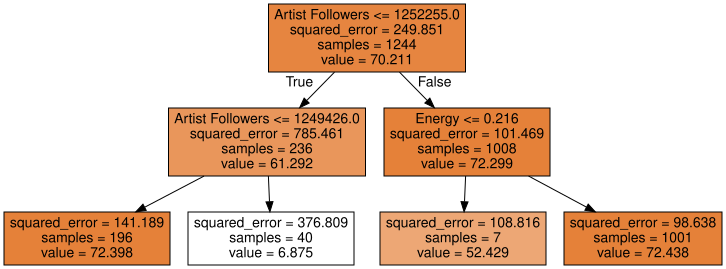

In [ ]:
display(
  graphviz.Source(
    tree.export_graphviz(
      model,
      feature_names = X.columns,
      filled = True,
    )
  )
)

### Random Forest Regression

In [ ]:
# two parameters - n_estimators (number of trees), max_depth (number of splits)
numLoops = 500

mean_error = np.zeros(numLoops)

np.random.seed(42)
for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.2 )
  model = RandomForestRegressor( n_estimators = 10 ) #n_estimators is number of trees in forest. Note: you can also choose max_depth for RFs
  model.fit( X_train, y_train )
  y_pred = model.predict( X_test )
  mean_error[idx] = mean_squared_error( y_test, y_pred )

print(f'RMSE: {np.sqrt(mean_error).mean()}')
print(f'RMSE_std: {np.sqrt(mean_error).std()}')
np.sqrt(mean_error)[:50]

RMSE: 11.078459480105694
RMSE_std: 0.7469825373278645


array([10.83396251, 10.38719935, 10.43913372, 11.21543551, 12.05845139,
       10.94809725, 12.28946561, 10.35784417, 10.09091353, 11.08021741,
       10.44890959, 10.67763592, 10.39255201, 11.0275282 ,  9.79229812,
       10.63827584, 11.10675182, 10.71413367, 10.08413308, 11.47910185,
       12.12731474, 10.56752706, 11.70822771, 11.71675056, 10.7049465 ,
       10.23059138, 11.1998841 , 10.59644806, 10.970089  , 10.75473509,
       10.26033407, 10.41297883, 11.06850431, 11.96248007, 12.44220356,
       10.74741919, 11.91443587,  9.23737184, 10.61517872, 10.52801276,
       11.03914219, 10.94470074, 11.59865985, 12.30601531, 11.64570186,
       10.57258338, 11.52282851,  9.98548305, 11.1570232 , 10.39025369])

In [ ]:
num_trees = range(10,60,10)
cv_loops = 100
rmse_results = np.zeros(len(num_trees))
std_results = np.zeros(len(num_trees))

for n, trees in enumerate(num_trees):
  rmse_cv = np.zeros(cv_loops)
  np.random.seed(42)
  for i in range(cv_loops):
    X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.20)
    rfModel = RandomForestRegressor( n_estimators=trees )
    rfModel.fit(X_train, y_train)
    y_pred_rf = rfModel.predict(X_test)
    rmse_cv[i] = np.sqrt(mean_squared_error(y_test, y_pred_rf))

  print(trees,' trees finished.')
  rmse_results[n] = rmse_cv.mean()
  std_results[n] = rmse_cv.std()


10  trees finished.
20  trees finished.
30  trees finished.
40  trees finished.
50  trees finished.


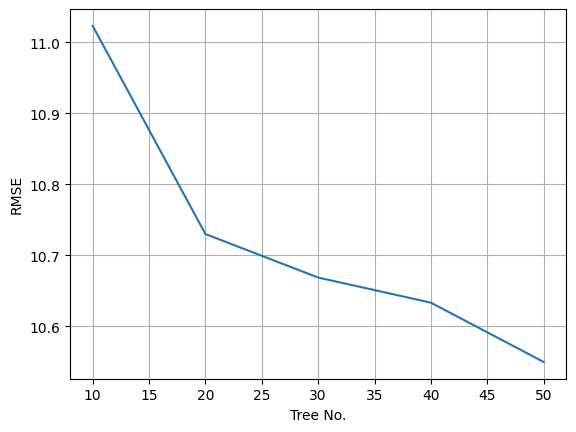

In [ ]:
plt.plot(num_trees, rmse_results)
plt.xlabel('Tree No.')
plt.ylabel('RMSE')
plt.grid()

In [ ]:
pd.DataFrame( zip( rmse_results, std_results, ) )

,0,1
0,11.023302,0.736398
1,10.730218,0.809310
2,10.668928,0.693892
3,10.633575,0.816331
4,10.550099,0.723715


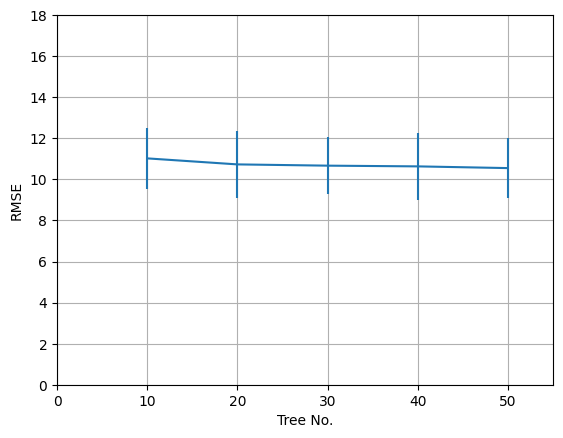

In [ ]:
plt.errorbar(num_trees, rmse_results, yerr=(std_results*2,std_results*2))
# plt.errorbar(num_trees, rmse_results, yerr=std_results)
plt.xlabel('Tree No.')
plt.ylabel('RMSE')
plt.ylim(0,18)
plt.xlim(0,55)
plt.grid()


In [ ]:
print(f'RMSE with 30 trees: {rmse_results[2]}')


RMSE with 30 trees: 10.668927727487723


In [ ]:
len(rfModel.estimators_)

50

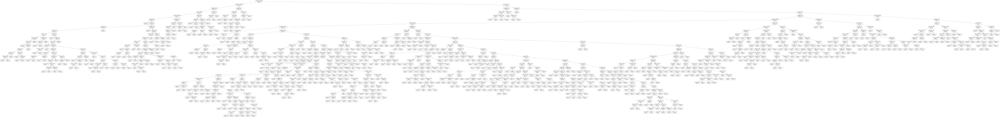

In [ ]:
# Display one tree from the random forest
display(
  graphviz.Source(
    tree.export_graphviz(
      rfModel.estimators_[0],
      feature_names = X.columns,
    )
  )
)


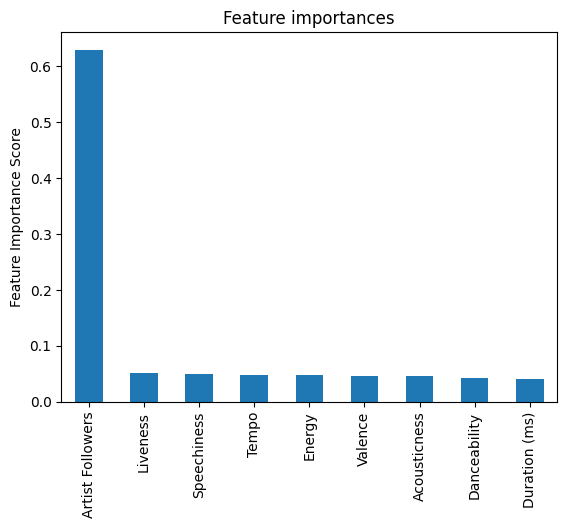

In [ ]:
importances = rfModel.feature_importances_
forest_importances = pd.Series( importances, index = X.columns )

plt.figure()
# forest_importances.plot.bar()
forest_importances.sort_values( ascending = False ).plot.bar()
plt.title("Feature importances")
plt.ylabel('Feature Importance Score') ;


In [ ]:
( forest_importances.sort_values( ascending = False ) * 100 ).cumsum()

,0
Artist Followers,62.922751
Liveness,68.102644
Speechiness,73.094617
Tempo,77.886105
Energy,82.564360
Valence,87.148599
Acousticness,91.708692
Danceability,95.985737
Duration (ms),100.000000


In [ ]:
spotify_clean

,Song Name,Streams,Artist,Artist Followers,Popularity,Danceability,Energy,Loudness,Speechiness,Acousticness,Liveness,Tempo,Duration (ms),Valence
Index,,,,,,,,,,,,,,
1,Beggin',"48,633,449",Måneskin,3377762.0,100.0,0.714,0.800,-4.808,0.0504,0.127000,0.3590,134.002000,211560.0,0.5890
2,STAY (with Justin Bieber),"47,248,719",The Kid LAROI,2230022.0,99.0,0.591,0.764,-5.484,0.0483,0.038300,0.1030,169.928000,141806.0,0.4780
3,good 4 u,"40,162,559",Olivia Rodrigo,6266514.0,99.0,0.563,0.664,-5.044,0.1540,0.335000,0.0849,166.928000,178147.0,0.6880
4,Bad Habits,"37,799,456",Ed Sheeran,83293380.0,98.0,0.808,0.897,-3.712,0.0348,0.046900,0.3640,126.026000,231041.0,0.5910
5,INDUSTRY BABY (feat. Jack Harlow),"33,948,454",Lil Nas X,5473565.0,96.0,0.736,0.704,-7.409,0.0615,0.020300,0.0501,149.995000,212000.0,0.8940
6,MONTERO (Call Me By Your Name),"30,071,134",Lil Nas X,5473565.0,97.0,0.610,0.508,-6.682,0.1520,0.297000,0.3840,178.818000,137876.0,0.7580
7,Kiss Me More (feat. SZA),"29,356,736",Doja Cat,8640063.0,94.0,0.762,0.701,-3.541,0.0286,0.235000,0.1230,110.968000,208867.0,0.7420
8,Todo De Ti,"26,951,613",Rauw Alejandro,6080597.0,95.0,0.780,0.718,-3.605,0.0506,0.310000,0.0932,127.949000,199604.0,0.3420
9,Yonaguni,"25,030,128",Bad Bunny,36142273.0,96.0,0.644,0.648,-4.601,0.1180,0.276000,0.1350,179.951000,206710.0,0.4400


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Step 1: Define the features
features = ['Danceability', 'Energy', 'Tempo', 'Valence',
            'Acousticness', 'Speechiness', 'Liveness', 'Duration (ms)', 'Artist Followers']
X = spotify_clean[features]
y = spotify_clean['Popularity']

# Step 2: Split into two versions of X
X_with_followers = X.copy()
X_without_followers = X.drop(columns=['Artist Followers'])

# Step 3: Create a function to train and evaluate
def evaluate_rf(X, y, label):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"{label} RMSE: {rmse:.2f}")
    return model, rmse

# Step 4: Run both models
model_with, rmse_with = evaluate_rf(X_with_followers, y, "With Artist Followers")
model_without, rmse_without = evaluate_rf(X_without_followers, y, "Without Artist Followers")


With Artist Followers RMSE: 10.14
Without Artist Followers RMSE: 15.34


### XG Boost

In [ ]:
numLoops = 100
mse_xgb  = np.zeros(numLoops)

for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.15)
  xgbr = xgb.XGBRegressor(objective ='reg:squarederror', verbosity=0, seed = 10)
  xgbr.fit(X_train,y_train)
  y_pred_xgb = xgbr.predict(X_test)
  mse_xgb[idx] = mean_squared_error(y_test,y_pred_xgb)

print(f'RMSE: {np.sqrt(mse_xgb).mean()}')

RMSE: 11.338247524461623


In [ ]:
y_pred_xgb[0]

np.float32(78.85162)

In [ ]:
y_test.to_numpy()[0]

np.float64(80.0)

In [ ]:
my_spotify = X_test[:3]
my_spotify

,Danceability,Energy,Tempo,Valence,Acousticness,Speechiness,Liveness,Duration (ms),Artist Followers
Index,,,,,,,,,
882,0.904,0.723,145.013,0.835,0.0631,0.2600,0.185,227478.0,3828418.0
1510,0.776,0.713,127.987,0.551,0.5250,0.1430,0.306,193453.0,1603670.0
659,0.669,0.843,147.080,0.702,0.1690,0.0268,0.195,255400.0,9470311.0


In [ ]:
xgbr.predict(my_spotify)


array([78.85162, 74.20864, 75.23569], dtype=float32)

In [ ]:
y_test[:3]

,Popularity
Index,
882,80.0
1510,65.0
659,43.0


#### XGBoost with Parameters

In [ ]:
# Specify the parameters you want to try and their ranges.
param_test = {
 'max_depth'     : [ 3, 4, 5, 6, 7 ],
 'learning_rate' : [ 0.1, 0.2, 0.3, 0.4 ],
 'n_estimators'  : [ 20, 40, 60, 80, 100, 120, 140 ],
}

# Perform the grid search
gsearch = GridSearchCV(
    estimator = xgb.XGBRegressor( objective = 'reg:squarederror', seed = 10 ),
    param_grid = param_test,
    scoring = 'neg_mean_squared_error',
    cv = 5,
)

# Fit to training data
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.05, random_state = 42 )
model = gsearch.fit(X_train,y_train)

# See grid search results
print(model.best_params_)


{'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 120}


#### Fit XGBoost with best parameters

In [ ]:
params = model.best_params_

numLoops = 100
mse_xgb  = np.zeros(numLoops)

for idx in range(0,numLoops):
  X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.15 )
  xgbr = xgb.XGBRegressor(
      objective ='reg:squarederror',
      verbosity=0,
      learning_rate = 0.1,
      max_depth = 4,
      n_estimators = 120,
      seed = 10,
  )
  xgbr.fit(X_train,y_train)
  y_pred_xgb = xgbr.predict(X_test)
  mse_xgb[idx] = mean_squared_error(y_test,y_pred_xgb)

print(f'RMSE: {np.sqrt(mse_xgb).mean()}')


RMSE: 10.790383194388765


/tmp/ipython-input-65-2337905131.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels( ax.get_xticklabels(), rotation = 90 )


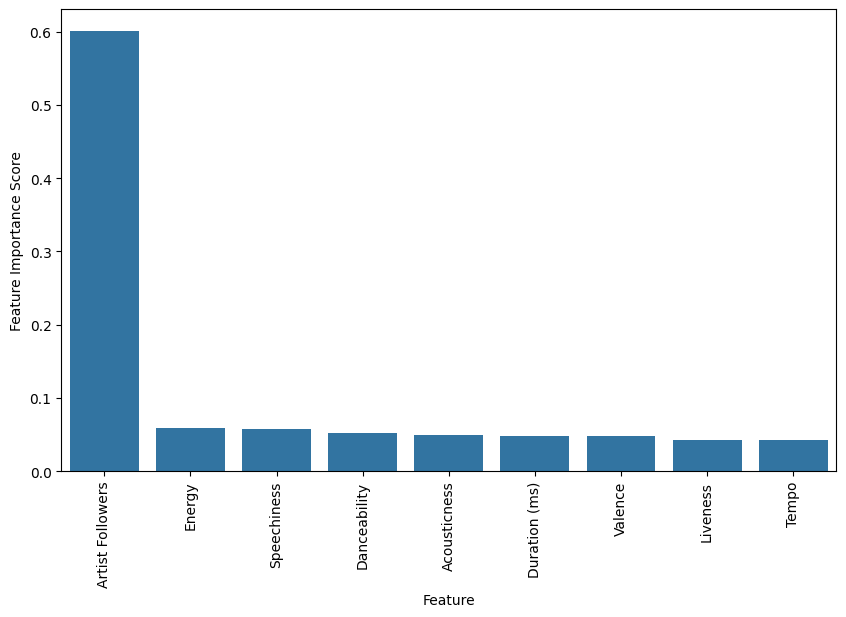

In [ ]:
feat_imp = pd.Series(xgbr.feature_importances_, index=X.columns).sort_values( ascending = False )
plt.figure(figsize = (10,6))
ax = sns.barplot(x = feat_imp.index, y = feat_imp.values )
ax.set_xticklabels( ax.get_xticklabels(), rotation = 90 )
plt.xlabel('Feature')
plt.ylabel('Feature Importance Score') ;

In [ ]:
(feat_imp.sort_values( ascending = False )*100).cumsum()

,0
Artist Followers,60.091858
Energy,66.005257
Speechiness,71.797508
Danceability,76.937958
Acousticness,81.872078
Duration (ms),86.694809
Valence,91.501549
Liveness,95.796959
Tempo,100.000000


## Communication of Results


The Random Forest had the lowest error, likely because it combines the results of many decision trees, which helps reduce overfitting and captures more complex relationships.
Interestingly, while XGBoost is often a top performer, in this case, it slightly underperformed—possibly due to limited hyperparameter tuning or the nature of the dataset.
The takeaway is that ensemble methods like Random Forest are particularly effective when dealing with moderately complex data like this.